####Import Libraries

In [106]:
import shutil
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, time
from sklearn.utils import resample
from matplotlib.dates import DateFormatter, AutoDateLocator

####Set Path in Google Drive

In [68]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

GOOGLE_DRIVE_PATH_AFTER_MYDRIVE = os.path.join('./DS/')
GOOGLE_DRIVE_PATH = os.path.join('gdrive', 'MyDrive', GOOGLE_DRIVE_PATH_AFTER_MYDRIVE)
print('List files: ', os.listdir(GOOGLE_DRIVE_PATH))

# Name of the zip file to extract
BaseFolderPath=GOOGLE_DRIVE_PATH
zip_file = BaseFolderPath+"Stress-Predict-Dataset-main.zip"

# Name of the folder where the extracted files will be stored
extract_folder = BaseFolderPath+"extract"


Mounted at /content/gdrive
List files:  ['Stress-Predict-Dataset-main.zip', 'extract', 'Input_data']


####Extract zip files

In [69]:
# Extract the zip file to the extract folder
shutil.unpack_archive(zip_file, extract_folder, 'zip')

####Get the folders present in main folder

In [70]:
# Set Parent folder where Raw_data folder is located
parent_folder = extract_folder+"/Stress-Predict-Dataset-main/"
# create a path to the Raw_data folder inside the parent folder
raw_data_path = os.path.join(parent_folder, "Raw_data/")
print(raw_data_path)
#Show the folders present in raw_data folder
def get_folders(folderpath):
    contents = os.listdir(raw_data_path)
    folders = [f for f in contents if os.path.isdir(os.path.join(raw_data_path, f))]
    return folders
all_folders=get_folders(raw_data_path)
print(all_folders)

gdrive/MyDrive/./DS/extract/Stress-Predict-Dataset-main/Raw_data/
['S02', 'S03', 'S04', 'S05', 'S06', 'S07', 'S08', 'S09', 'S10', 'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20', 'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27', 'S28', 'S29', 'S30', 'S31', 'S32', 'S33', 'S34', 'S35', 'S01']


####Drop participant S01 data and check if it is dropped

In [71]:
# Remove folder S01 as the values captured for candidate 1 is incorrect
if os.path.exists(raw_data_path+"/S01") and os.path.isdir(raw_data_path+"/S01"):
    shutil.rmtree(raw_data_path+"/S01")
#Show the folders present in raw_data folder
folders=get_folders(raw_data_path)
print(folders)

def get_directory_paths(parent_directory_path):
    directory_paths = []
    for name in os.listdir(parent_directory_path):
        path = os.path.join(parent_directory_path, name)
        if os.path.isdir(path):
            directory_paths.append(path)
    return directory_paths
final_folders=get_directory_paths(raw_data_path)

['S02', 'S03', 'S04', 'S05', 'S06', 'S07', 'S08', 'S09', 'S10', 'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20', 'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27', 'S28', 'S29', 'S30', 'S31', 'S32', 'S33', 'S34', 'S35']


##Data Preparation

In [72]:
# Define the final columns for each signal
final_columns = {
    'ACC': ['id', 'X', 'Y', 'Z', 'datetime'],
    'BVP': ['id', 'BVP', 'datetime'],
    'EDA': ['id', 'EDA', 'datetime'],
    'HR': ['id', 'HR', 'datetime'],
    'IBI': ['id', 'IBI_Initial', 'IBI_Interval', 'datetime'],
    'TEMP': ['id', 'TEMP', 'datetime'],
}

# Define the column names for each signal file
names = {
    'ACC.csv': ['X', 'Y', 'Z'],
    'BVP.csv': ['BVP'],
    'EDA.csv': ['EDA'],
    'HR.csv': ['HR'],
    'IBI.csv': ['IBI_Initial', 'IBI_Interval'],
    'TEMP.csv': ['TEMP'],
}
# Define the list of desired signal files
desired_signals = ['ACC.csv', 'BVP.csv', 'EDA.csv', 'HR.csv', 'IBI.csv', 'TEMP.csv']

# Create empty dataframes for each signal
acc = pd.DataFrame(columns=final_columns['ACC'])
bvp = pd.DataFrame(columns=final_columns['BVP'])
eda = pd.DataFrame(columns=final_columns['EDA'])
hr = pd.DataFrame(columns=final_columns['HR'])
ibi = pd.DataFrame(columns=final_columns['IBI'])
temp = pd.DataFrame(columns=final_columns['TEMP'])

# Define function to process each dataframe
def process_df(df, file):
  # Get start timestamp and sample rate from dataframe
  start_timestamp = df.iloc[0,0]
  sample_rate = df.iloc[1,0]
  # Create new dataframe with data values and add id and datetime columns
  new_df = pd.DataFrame(df.iloc[2:].values, columns=df.columns)
  new_df['id'] =  file[-2:]
  new_df['datetime'] = [(start_timestamp + i/sample_rate) for i in range(len(new_df))]
  return new_df
# Define function to process IBI dataframe                
def ibi_process_df(df, file):
  start_timestamp = df.iloc[0,0]
  sample_rate = 1
  new_df = pd.DataFrame(df.iloc[2:].values, columns=df.columns)
  new_df['id'] =  file[-2:]
  new_df['datetime'] = [(start_timestamp + i/sample_rate) for i in range(len(new_df))]
  return new_df

# Loop over all subfolders and files in the raw data path  
for sub_folder in os.listdir(raw_data_path):
    sub_folder_path = os.path.join(raw_data_path, sub_folder)
    if os.path.isdir(sub_folder_path):
        for signal in os.listdir(sub_folder_path):
            if os.path.isfile(os.path.join(sub_folder_path, signal)):
                # Check if file is one of the desired signal files
                if signal in desired_signals:
                    # Read the file into a pandas dataframe using the corresponding column names
                    df = pd.read_csv(os.path.join(sub_folder_path, signal), names=names[signal], header=None)
                    if not df.empty:
                        # Concatenate the processed dataframe to the corresponding signal dataframe
                        if signal == 'ACC.csv':
                            acc = pd.concat([acc, process_df(df, sub_folder)])
                            print("ACC df:", acc)
                        if signal == 'BVP.csv':
                            bvp = pd.concat([bvp, process_df(df, sub_folder)])
                            print("BVP df:", bvp)
                        if signal == 'EDA.csv':
                            eda = pd.concat([eda, process_df(df, sub_folder)])
                            print("EDA df:", eda)
                        if signal == 'HR.csv':
                            hr = pd.concat([hr, process_df(df, sub_folder)])
                            print("HR df:", hr)
                        if signal == 'IBI.csv':
                            ibi = pd.concat([ibi, ibi_process_df(df, sub_folder)])
                            print("IBI df:", ibi)
                        if signal == 'TEMP.csv':
                            temp = pd.concat([temp, process_df(df, sub_folder)])
                            print("TEMP df:", temp)

ACC df:         id     X     Y     Z      datetime
0       02   2.0  10.0  63.0  1.644228e+09
1       02   4.0  12.0  66.0  1.644228e+09
2       02  -1.0  13.0  63.0  1.644228e+09
3       02  -7.0  11.0  59.0  1.644228e+09
4       02  -7.0   6.0  57.0  1.644228e+09
...     ..   ...   ...   ...           ...
114049  02  22.0   2.0  55.0  1.644231e+09
114050  02  23.0   0.0  58.0  1.644231e+09
114051  02  23.0  -2.0  63.0  1.644231e+09
114052  02  22.0   0.0  64.0  1.644231e+09
114053  02  21.0  -2.0  63.0  1.644231e+09

[114054 rows x 5 columns]
BVP df:         id    BVP      datetime
0       02  -0.00  1.644228e+09
1       02  -0.00  1.644228e+09
2       02  -0.00  1.644228e+09
3       02  -0.00  1.644228e+09
4       02  -0.00  1.644228e+09
...     ..    ...           ...
228168  02   0.11  1.644231e+09
228169  02   1.57  1.644231e+09
228170  02  -0.57  1.644231e+09
228171  02  -5.74  1.644231e+09
228172  02 -11.50  1.644231e+09

[228173 rows x 3 columns]
EDA df:        id       EDA   

####Reset index

In [73]:
#Reset index
acc.reset_index(drop=True, inplace=True)
bvp.reset_index(drop=True, inplace=True)
eda.reset_index(drop=True, inplace=True)
hr.reset_index(drop=True, inplace=True)
ibi.reset_index(drop=True, inplace=True)
temp.reset_index(drop=True, inplace=True)

####Convert datetime column to datetime format



In [74]:
#Function to convert dataframe having datetime column to datetime format
def convert_datetime(dfs):
    for df in dfs:
        df['datetime'] = pd.to_datetime(df['datetime'], unit='s', utc=True)

In [75]:
# Convert to  datetime
dfs=[acc,bvp,eda,hr,ibi,temp]
convert_datetime(dfs)

####Set datetime column as index to resample the data

In [76]:
# Set "datetime" column as index
def set_column_index(dfs):
  for df in dfs:
    df.set_index('datetime', inplace=True)

df_list=[acc,bvp,eda,temp]
set_column_index(df_list)

####The data is resampled to a frequency of 1 second because the stress signals have different frequencies. This will ensure that all the signals have the same frequency and can be analyzed together

In [77]:
#Set sampling rate to 1 second
common_hz='1S'
# Resample the dataframes having features at different sampling rate to 1 second frequency
df_resampled_acc = acc.resample(common_hz).agg({'X':'mean', 'Y':'mean', 'Z':'mean', 'id':'last'})
df_resampled_bvp = bvp.resample(common_hz).agg({'BVP':'mean', 'id':'last'})
df_resampled_eda = eda.resample(common_hz).agg({'EDA':'mean', 'id':'last'})
df_resampled_temp = temp.resample(common_hz).agg({'TEMP':'mean', 'id':'last'})

####Reset datetime back to column

In [78]:
# Reset the index of df_resampled
df_resampled_acc=df_resampled_acc.reset_index()
df_resampled_bvp=df_resampled_bvp.reset_index()
df_resampled_eda=df_resampled_eda.reset_index()
df_resampled_temp=df_resampled_temp.reset_index()

####Combine all the signals into 1 dataframe

In [79]:
# Concatenate the dataframes along the columns axis (axis=1)
combined_data = pd.concat([df_resampled_acc,df_resampled_bvp,df_resampled_eda,hr,ibi,df_resampled_temp], axis=1)

####Display the combined dataframe

In [80]:
combined_data.head()

,datetime,X,Y,Z,id,datetime,BVP,id,datetime,EDA,...,id,HR,datetime,id,IBI_Initial,IBI_Interval,datetime,datetime,TEMP,id
0,2022-02-07 09:52:54+00:00,2.59375,4.06250,61.28125,02,2022-02-07 09:52:54+00:00,15.760000,02,2022-02-07 09:52:54+00:00,0.566449,...,02,118.00,2022-02-07 09:53:04+00:00,02,604.9375,0.937500,2022-02-07 09:52:54+00:00,2022-02-07 09:52:54+00:00,34.79,02
1,2022-02-07 09:52:55+00:00,-4.46875,6.50000,63.15625,02,2022-02-07 09:52:55+00:00,-41.960313,02,2022-02-07 09:52:55+00:00,0.654746,...,02,113.50,2022-02-07 09:53:05+00:00,02,605.6875,0.750000,2022-02-07 09:52:55+00:00,2022-02-07 09:52:55+00:00,34.79,02
2,2022-02-07 09:52:56+00:00,-4.12500,5.28125,63.65625,02,2022-02-07 09:52:56+00:00,26.097031,02,2022-02-07 09:52:56+00:00,0.664677,...,02,93.00,2022-02-07 09:53:06+00:00,02,609.5625,0.859375,2022-02-07 09:52:56+00:00,2022-02-07 09:52:56+00:00,34.79,02
3,2022-02-07 09:52:57+00:00,-7.62500,5.46875,63.15625,02,2022-02-07 09:52:57+00:00,4.685781,02,2022-02-07 09:52:57+00:00,0.677812,...,02,93.25,2022-02-07 09:53:07+00:00,02,644.765625,0.875000,2022-02-07 09:52:57+00:00,2022-02-07 09:52:57+00:00,34.68,02
4,2022-02-07 09:52:58+00:00,-14.59375,5.87500,62.28125,02,2022-02-07 09:52:58+00:00,-7.058125,02,2022-02-07 09:52:58+00:00,0.685500,...,02,86.40,2022-02-07 09:53:08+00:00,02,645.640625,0.875000,2022-02-07 09:52:58+00:00,2022-02-07 09:52:58+00:00,34.66,02


####Merge the combine dataframe based on datetime and using outer join

In [81]:
#Merge the data 
for i in combined_data:
    if isinstance(i, tuple) and len(i) >= 2:
        globals()[i[0]] = i[1]
        
ids = df_resampled_eda['id'].unique()
columns = ['X', 'Y', 'Z','BVP', 'EDA', 'HR','IBI', 'TEMP', 'id', 'datetime']

results = []
for id in ids:
    print(f"Processing {id}")
    df = pd.DataFrame(columns=columns)
    
    #Keep single id column and drop remaining id columns
    acc_id = df_resampled_acc[df_resampled_acc['id'] == id]
    bvp_id = df_resampled_bvp[df_resampled_bvp['id'] == id].drop(['id'], axis=1)
    eda_id = df_resampled_eda[df_resampled_eda['id'] == id].drop(['id'], axis=1)
    hr_id = hr[hr['id'] == id].drop(['id'], axis=1)
    ibi_id = ibi[ibi['id'] == id].drop(['id'], axis=1)
    temp_id = df_resampled_temp[df_resampled_temp['id'] == id].drop(['id'], axis=1)

    #Merge dataframes using datetime and outerjoin
    df = acc_id.merge(bvp_id, on='datetime', how='outer')
    df = df.merge(eda_id, on='datetime', how='outer')
    df = df.merge(hr_id, on='datetime', how='outer')
    df = df.merge(ibi_id, on='datetime', how='outer')
    df = df.merge(temp_id, on='datetime', how='outer')

    #Filling null values with Forward and Backward value imputation
    df.fillna(method='ffill', inplace=True)
    df.fillna(method='bfill', inplace=True)

    results.append(df)

print(results)
stress_data = pd.concat(results, ignore_index=True)

Processing 02
Processing None
Processing 03
Processing 04
Processing 05
Processing 06
Processing 07
Processing 08
Processing 09
Processing 10
Processing 11
Processing 12
Processing 13
Processing 14
Processing 15
Processing 16
Processing 17
Processing 18
Processing 19
Processing 20
Processing 21
Processing 22
Processing 23
Processing 24
Processing 25
Processing 26
Processing 27
Processing 28
Processing 29
Processing 30
Processing 31
Processing 32
Processing 33
Processing 34
Processing 35
[                      datetime         X          Y          Z  id  \
0    2022-02-07 09:52:54+00:00   2.59375   4.062500  61.281250  02   
1    2022-02-07 09:52:55+00:00  -4.46875   6.500000  63.156250  02   
2    2022-02-07 09:52:56+00:00  -4.12500   5.281250  63.656250  02   
3    2022-02-07 09:52:57+00:00  -7.62500   5.468750  63.156250  02   
4    2022-02-07 09:52:58+00:00 -14.59375   5.875000  62.281250  02   
...                        ...       ...        ...        ...  ..   
3561 2022-02-07 1

####Rearrange the columns

In [82]:
# Rearrange columns
stress_data = stress_data[['id', 'datetime', 'X', 'Y', 'Z', 'BVP', 'EDA', 'HR', 'IBI_Initial', 'IBI_Interval', 'TEMP']]

####Sort the data based on datetime column

In [83]:
#Sort the dataframe by datetime
stress_data=stress_data.sort_values(by='datetime')

####Convert to 12hr time format

In [84]:
# Converting the timestamp to 12 hour format
stress_data['datetime'] = stress_data['datetime'].dt.strftime('%Y-%m-%d %I:%M:%S')

####Read Time logs file

In [85]:
# Read the time_logs file
time_logs = pd.read_excel(extract_folder+'/Stress-Predict-Dataset-main/Processed_data/Time_logs.xlsx')
time_logs.head()

,S. ID.,Start Time,End Time,Session ID,Consent,Unnamed: 5,Baseline/Questionniare,Unnamed: 7,Stroop Test,Unnamed: 9,...,Hyperventilation,Unnamed: 17,Relax.2,Unnamed: 19,Questionniare,Unnamed: 21,Relax/Baseline,Unnamed: 23,Unnamed: 24,Date
0,NaN,NaN,NaN,NaN,Start,End,Start,End,Start,End,...,Start,End,Start,End,Start,End,Start,End,NaN,NaT
1,S01,09:22:00,10:22:00,1445405.0,09:22:00,09:27:00,09:39:00,09:43:00,09:29:00,09:34:00,...,10:00:00,10:02:00,10:02:00,10:07:00,10:08:00,10:12:00,10:12:00,10:22:00,Day 1,2022-02-07
2,S02,09:48:00,10:51:00,1445449.0,09:48:00,09:50:00,09:52:00,10:02:00,10:03:00,10:08:00,...,10:29:00,10:31:00,10:31:00,10:36:00,10:36:00,10:41:00,10:41:00,10:51:00,Day 1,2022-02-07
3,S03,10:50:00,11:50:00,1445450.0,10:50:00,10:53:00,10:55:00,11:02:00,11:04:00,11:09:00,...,11:28:00,11:30:00,11:30:00,11:35:00,11:35:00,11:40:00,11:40:00,11:50:00,Day 1,2022-02-07
4,S04,11:25:00,12:28:00,1445452.0,11:25:00,11:30:00,11:30:00,11:40:00,11:40:00,11:45:00,...,12:05:00,12:07:00,12:07:00,12:12:00,12:12:00,12:18:00,12:18:00,12:28:00,Day 1,2022-02-07


####Change header S.ID column in timelogs file to id

In [86]:
# Remove the 'S' from the 'id' column
time_logs['S. ID.'] = time_logs['S. ID.'].str.replace('S', '')

# Rename the 'S. ID.' column to 'id'
time_logs = time_logs.rename(columns={'S. ID.': 'id'})

#Display time logs dataframe
time_logs.head()

,id,Start Time,End Time,Session ID,Consent,Unnamed: 5,Baseline/Questionniare,Unnamed: 7,Stroop Test,Unnamed: 9,...,Hyperventilation,Unnamed: 17,Relax.2,Unnamed: 19,Questionniare,Unnamed: 21,Relax/Baseline,Unnamed: 23,Unnamed: 24,Date
0,NaN,NaN,NaN,NaN,Start,End,Start,End,Start,End,...,Start,End,Start,End,Start,End,Start,End,NaN,NaT
1,01,09:22:00,10:22:00,1445405.0,09:22:00,09:27:00,09:39:00,09:43:00,09:29:00,09:34:00,...,10:00:00,10:02:00,10:02:00,10:07:00,10:08:00,10:12:00,10:12:00,10:22:00,Day 1,2022-02-07
2,02,09:48:00,10:51:00,1445449.0,09:48:00,09:50:00,09:52:00,10:02:00,10:03:00,10:08:00,...,10:29:00,10:31:00,10:31:00,10:36:00,10:36:00,10:41:00,10:41:00,10:51:00,Day 1,2022-02-07
3,03,10:50:00,11:50:00,1445450.0,10:50:00,10:53:00,10:55:00,11:02:00,11:04:00,11:09:00,...,11:28:00,11:30:00,11:30:00,11:35:00,11:35:00,11:40:00,11:40:00,11:50:00,Day 1,2022-02-07
4,04,11:25:00,12:28:00,1445452.0,11:25:00,11:30:00,11:30:00,11:40:00,11:40:00,11:45:00,...,12:05:00,12:07:00,12:07:00,12:12:00,12:12:00,12:18:00,12:18:00,12:28:00,Day 1,2022-02-07


####Function to get Test times

In [87]:
def get_test_times(data, time_logs):
  # Get column indices from user input or configuration file
  stroop_start_col = (9)
  stroop_end_col = (10)
  interview_start_col = (13)
  interview_end_col = (14)
  hypervent_start_col = (17)
  hypervent_end_col = (18)
  questionaire_start_col = (21)
  questionaire_end_col = (22)
  test_times = {}
  for id in data["id"].unique():
      id_data = time_logs[time_logs["id"] == id]
      test_start_end_times = []
      for test in [("stroop", stroop_start_col, stroop_end_col), ("interview", interview_start_col, interview_end_col), ("hypervent", hypervent_start_col, hypervent_end_col), ("questionaire", questionaire_start_col, questionaire_end_col)]:
          if pd.notnull(id_data.iloc[0, test[1]-1]) and pd.notnull(id_data.iloc[0, test[2]]):
              start_time = datetime.combine(id_data.iloc[0]['Date'], id_data.iloc[0, test[1]-1]).strftime("%H:%M")
              end_time = datetime.combine(id_data.iloc[0]['Date'], id_data.iloc[0, test[2]]).strftime("%H:%M")
              test_start_end_times.append((start_time, end_time))
      test_times[id] = test_start_end_times
  return test_times

####Call function to get test times

In [88]:
test_times=get_test_times(stress_data, time_logs)
print(test_times)

{'02': [('10:03', '10:08'), ('10:13', '10:24'), ('10:29', '10:31'), ('10:36', '10:41')], '03': [('11:04', '11:09'), ('11:14', '11:23'), ('11:28', '11:30'), ('11:35', '11:40')], '04': [('11:40', '11:45'), ('11:50', '12:00'), ('12:05', '12:07'), ('12:12', '12:18')], '05': [('09:23', '09:29'), ('09:34', '09:44'), ('09:49', '09:51'), ('09:56', '10:01')], '06': [('09:55', '10:02'), ('10:07', '10:18'), ('10:23', '10:25'), ('10:30', '10:35')], '07': [('10:43', '10:48'), ('10:53', '11:03'), ('11:09', '11:11'), ('11:16', '11:21')], '08': [('12:23', '12:28'), ('12:34', '12:43'), ('12:48', '12:50'), ('12:55', '01:00')], '09': [('12:49', '12:54'), ('12:59', '01:09'), ('01:14', '01:16'), ('01:21', '01:26')], '10': [('01:23', '01:29'), ('01:34', '01:43'), ('01:49', '01:51'), ('01:56', '01:59')], '11': [('03:32', '03:38'), ('03:43', '03:53'), ('03:58', '04:01'), ('04:06', '04:10')], '12': [('09:26', '09:31'), ('09:38', '09:48'), ('09:53', '09:55'), ('10:00', '10:05')], '13': [('11:35', '11:42'), ('11

####Check if datetime is present in between test time , if yes then set label as 1 else set label as 0

In [89]:
# Convert datetime column to datetime datatype
stress_data["datetime"] = pd.to_datetime(stress_data["datetime"])

# Check whether the datetime present within the test time if yes set label to 1 else set label to 0
def get_label(row):
    test_key = row["id"]
    if test_key in test_times:
        for start, end in test_times[test_key]:
            start_time = datetime.strptime(start, "%H:%M").time()
            end_time = datetime.strptime(end, "%H:%M").time()
            datetime_val = row["datetime"].time()
            if start_time <= datetime_val <= end_time:
                return 1
    return 0

# Add label column to stress_data
stress_data["label"] = stress_data.apply(get_label, axis=1)

####Get label count of 1 and 0

In [90]:
#Get label count of 1 and 0
label_counts = stress_data['label'].value_counts()
#Display label count
print("Number of 0s in 'label' column:", label_counts[0])
print("Number of 1s in 'label' column:", label_counts[1])

Number of 0s in 'label' column: 68068
Number of 1s in 'label' column: 45132


####Check datatype of all columns

In [91]:
#Check the datatype of values of all columns
stress_data.dtypes

id                      object
datetime        datetime64[ns]
X                      float64
Y                      float64
Z                      float64
BVP                    float64
EDA                    float64
HR                     float64
IBI_Initial            float64
IBI_Interval            object
TEMP                   float64
label                    int64
dtype: object

####Convert IBI_Interval signal to float datatype

In [92]:
#Convert datatype of IBI_Interval column to float 
stress_data['IBI_Interval'] = stress_data['IBI_Interval'].astype(float)

####Check the statistical summary for the complete data set

In [93]:
stress_data.describe()

,X,Y,Z,BVP,EDA,HR,IBI_Initial,IBI_Interval,TEMP,label
count,113200.000000,113200.000000,113200.000000,113200.000000,113200.000000,113200.000000,113200.000000,113200.000000,113200.000000,113200.000000
mean,-35.679644,-1.747738,38.169607,-5.168672,1.004964,80.186928,2453.740513,0.798199,31.372180,0.398693
std,19.574086,17.284378,22.258570,39.950129,1.351178,12.733209,1046.062419,0.157345,2.330875,0.489631
min,-71.250000,-64.156250,-64.625000,-456.254687,0.000641,49.000000,12.125000,0.312500,26.300000,0.000000
25%,-50.812500,-10.500000,23.593750,-5.143750,0.264259,71.330000,1640.687500,0.687500,29.690000,0.000000
50%,-35.937500,-2.000000,46.218750,-0.230000,0.528496,77.830000,3001.687500,0.781250,31.350000,0.000000
75%,-23.281250,5.406250,55.875000,4.469792,1.006739,86.980000,3269.953125,0.890625,33.050000,1.000000
max,66.218750,74.343750,67.562500,404.459844,10.982597,146.780000,3542.312499,1.703125,36.390000,1.000000


##Data Visualization

In [94]:
#Making copy of dataframe 
time_data1=stress_data.copy()
time_data1.set_index('datetime', inplace=True)

####Function plot0 takes in two arguments, features and dataframe, and plots a timeseries graph for all participants combined for all dates.

In [95]:
#Function to plot timeseries graph for all participants combined for all dates
def plot0(feature,data):
  fig, ax = plt.subplots(figsize=(10, 6))

  # Define colors for each label
  colors = {0: 'blue', 1: 'red'}

  # Create a line plot of feature with respect to datetime, colored by label
  for label, group in data.groupby('label'):
      ax.plot(group.index, group[feature], color=colors[label], label=label)

  # Set the labels for the x-axis and y-axis
  ax.set_xlabel('Datetime')
  ax.set_ylabel(feature)

  # Add title
  ax.set_title(feature+' data')

  # Add legend
  ax.legend()

  # Format the x-axis dates
  date_format = DateFormatter('%Y-%m-%d %H:%M:%S')
  ax.xaxis.set_major_locator(AutoDateLocator())
  ax.xaxis.set_major_formatter(date_format)
  ax.xaxis.set_tick_params(rotation=30, labelsize=10)

  # Show the plot
  plt.show()

#### Call function plot0 and plot graph

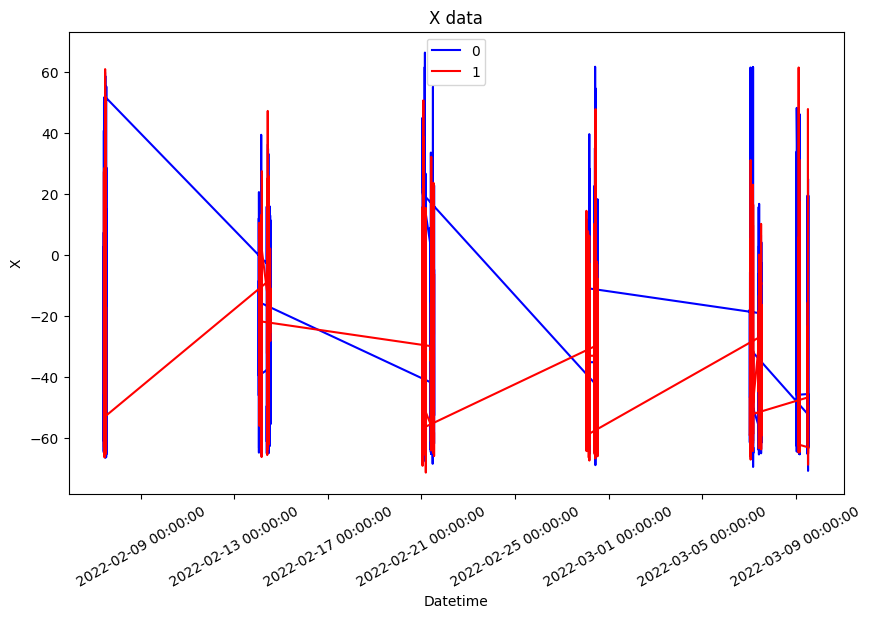

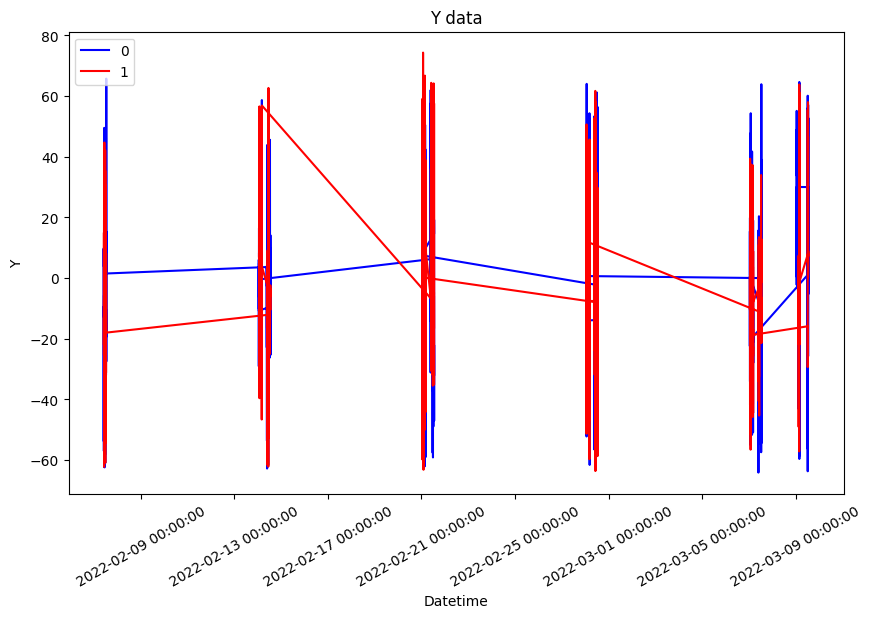

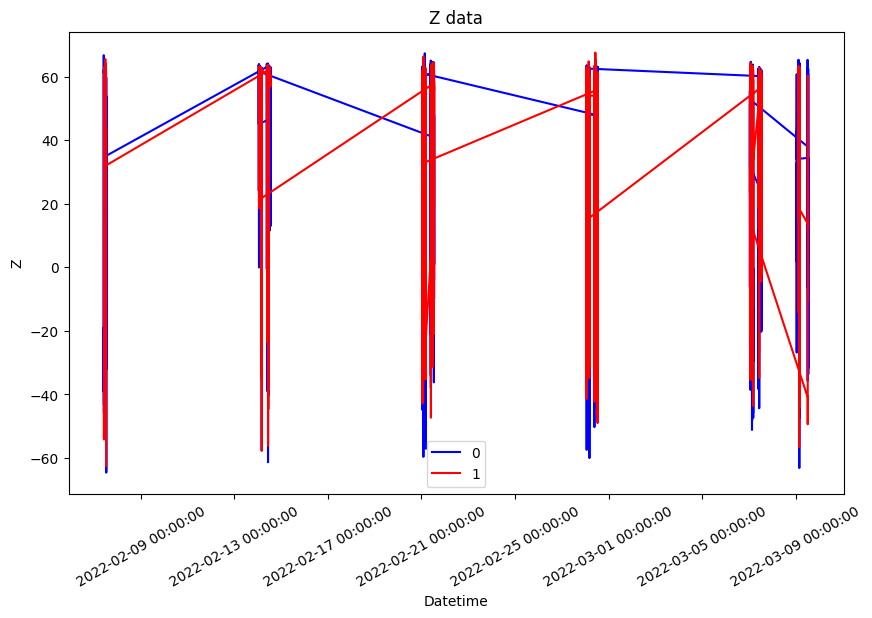

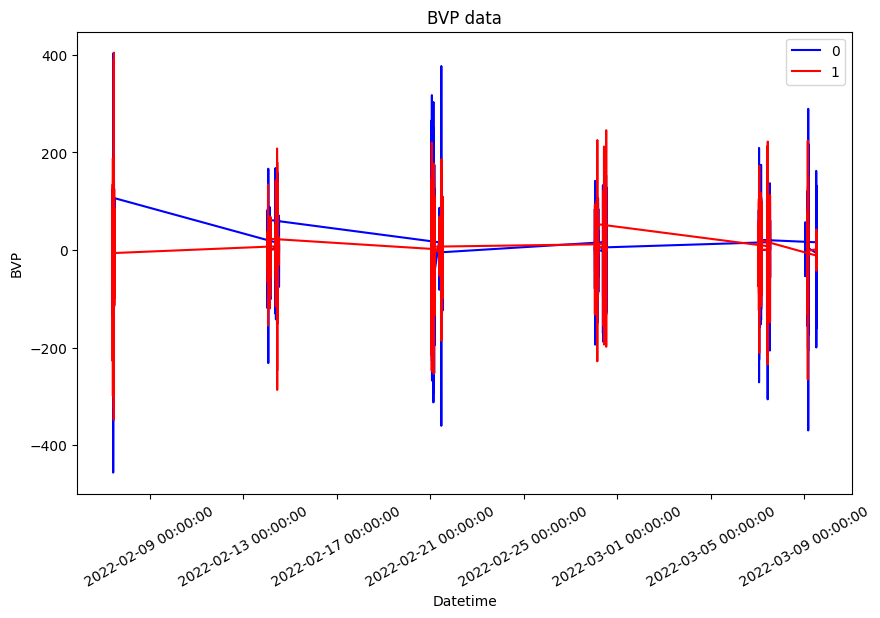

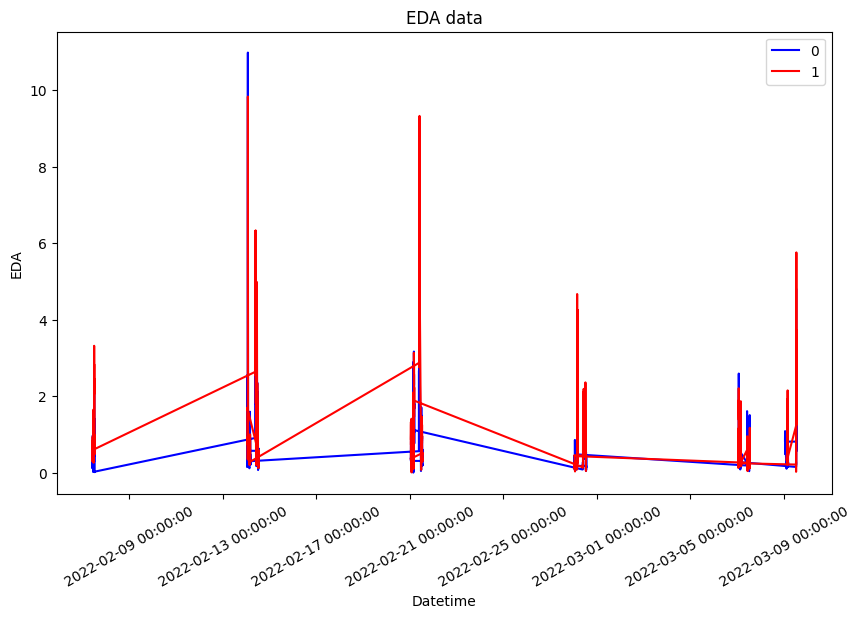

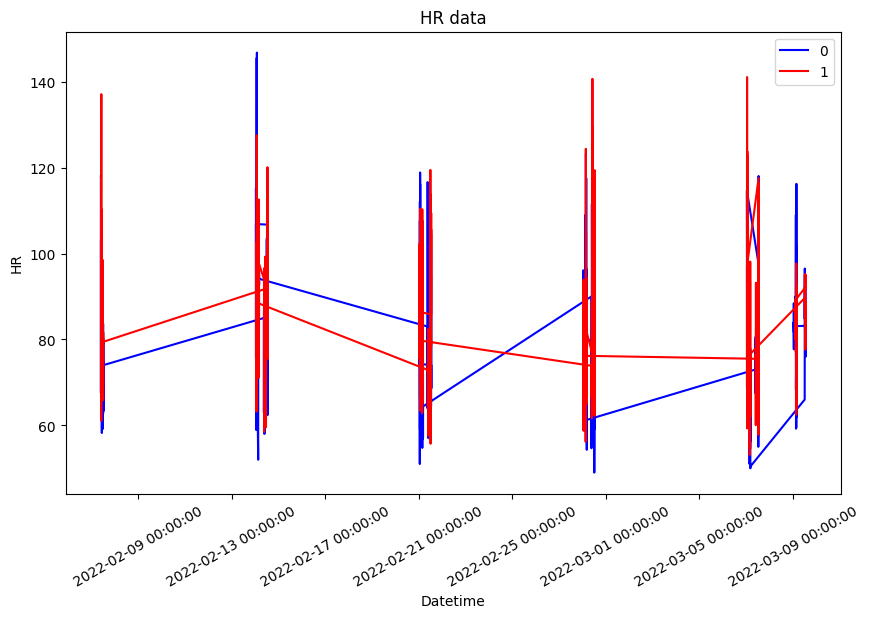

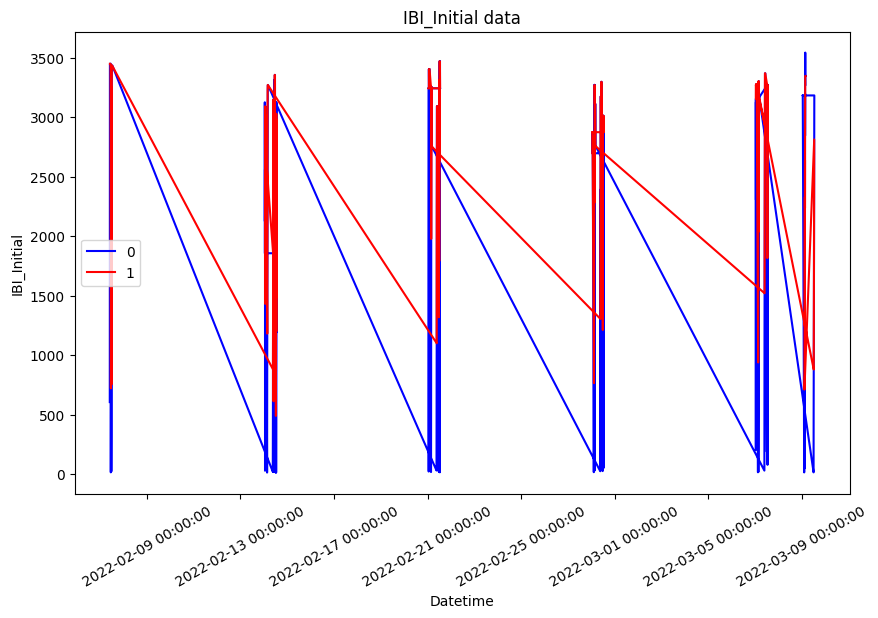

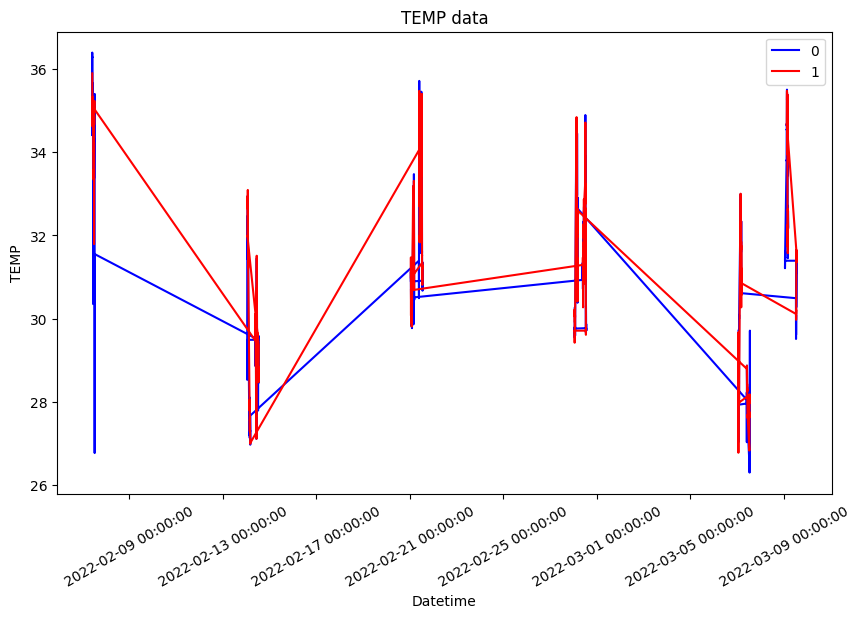

In [96]:
#Call function to plot timeseries graph for all participants combined for different features
features = ['X','Y','Z','BVP','EDA','HR','IBI_Initial','TEMP']
for feature in features:
    plot0(feature,time_data1)

####From above plot we can see the stress signals has been captured for 34 participants for all signals during the test time

####Function plot1 is used to plot time series graph for particulart test dates 

In [97]:
#Function to plot timeseries graph on each date
def plot1(dates,feature):
  # Filter the data for date 2022-02-07
  filtered_data = time_data1.loc[date]

  # Create a new figure and axis
  fig, ax = plt.subplots(figsize=(10, 6))

  # Define colors for each label
  colors = {0: 'blue', 1: 'red'}

  # Create a line plot of feature with respect to datetime, colored by label
  for label, group in filtered_data.groupby('label'):
      ax.plot(group.index, group['HR'], color=colors[label], label=label)

  # Set the labels for the x-axis and y-axis
  ax.set_xlabel('Datetime')
  ax.set_ylabel(feature)

  # Add title
  ax.set_title(feature+' data for '+date)

  # Add legend
  ax.legend()

  # Format the x-axis dates
  date_format = DateFormatter('%H:%M')
  ax.xaxis.set_major_locator(AutoDateLocator())
  ax.xaxis.set_major_formatter(date_format)
  ax.xaxis.set_tick_params(rotation=30, labelsize=10)

  # Show the plot
  plt.show()

####Function plot1 takes in two arguments, features and dates, and plots a timeseries graph for all participants for particular dates when test were taken

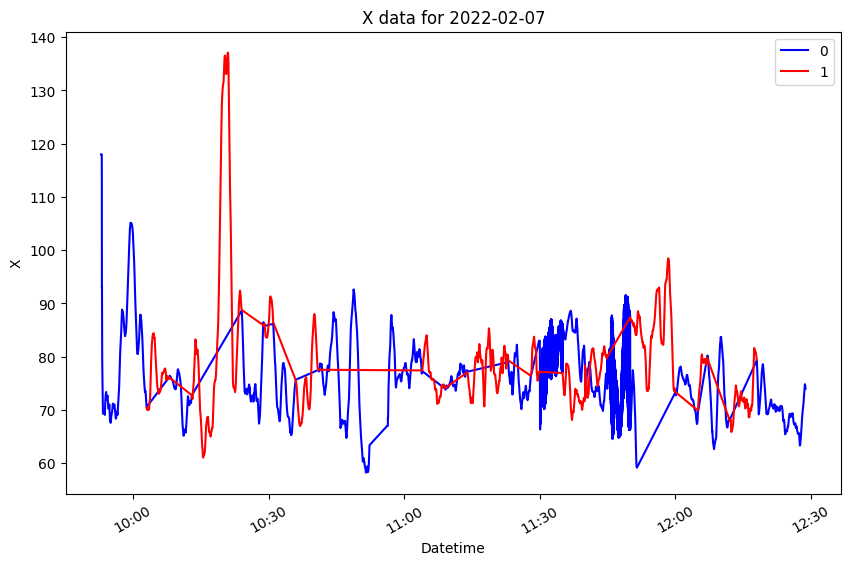

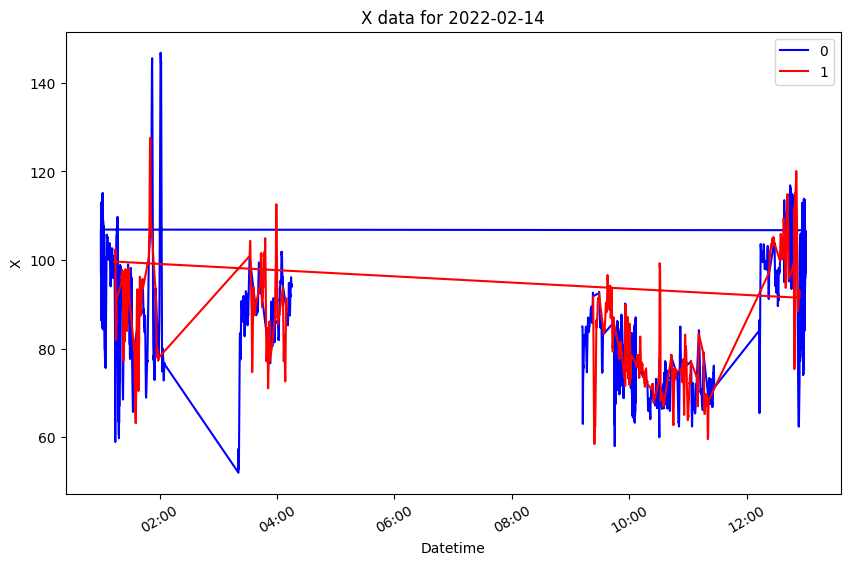

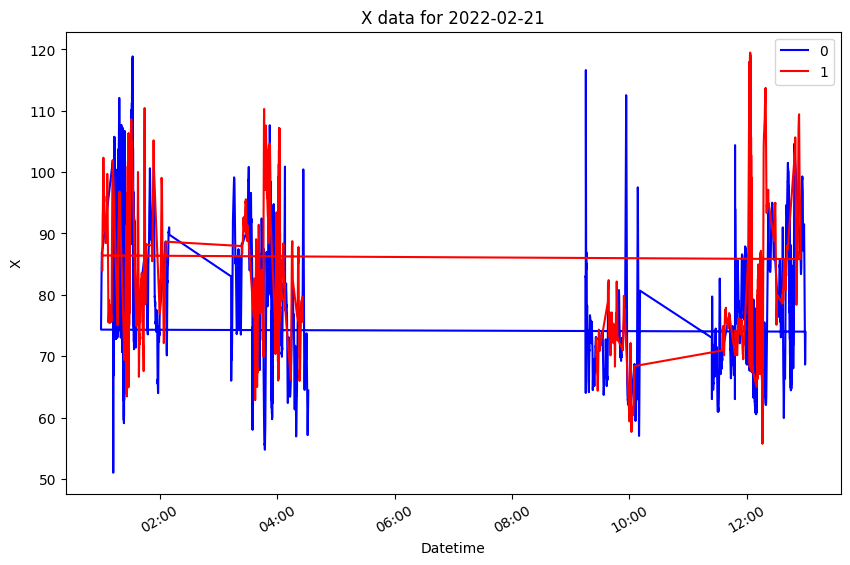

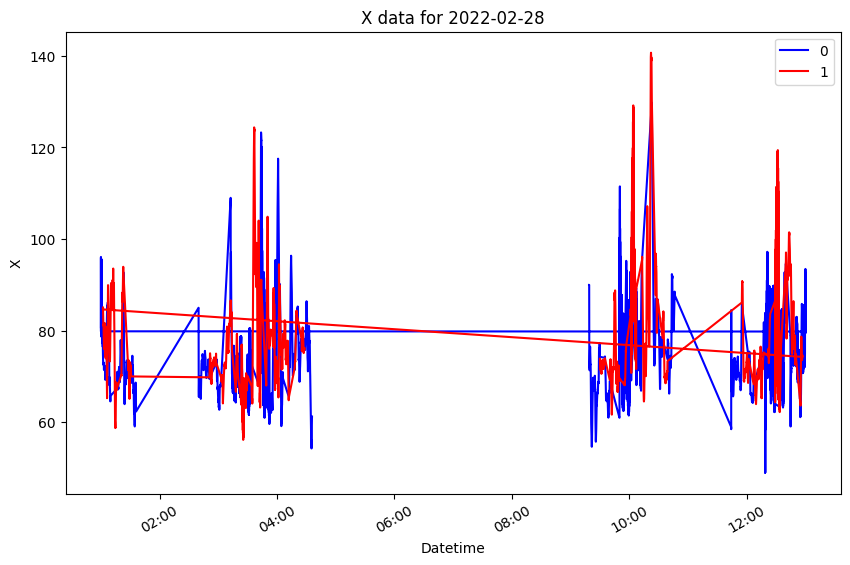

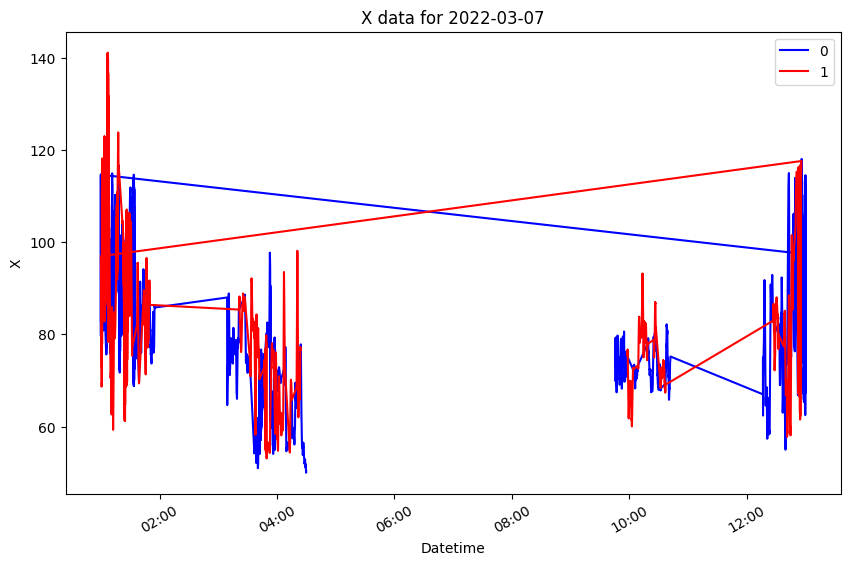

...

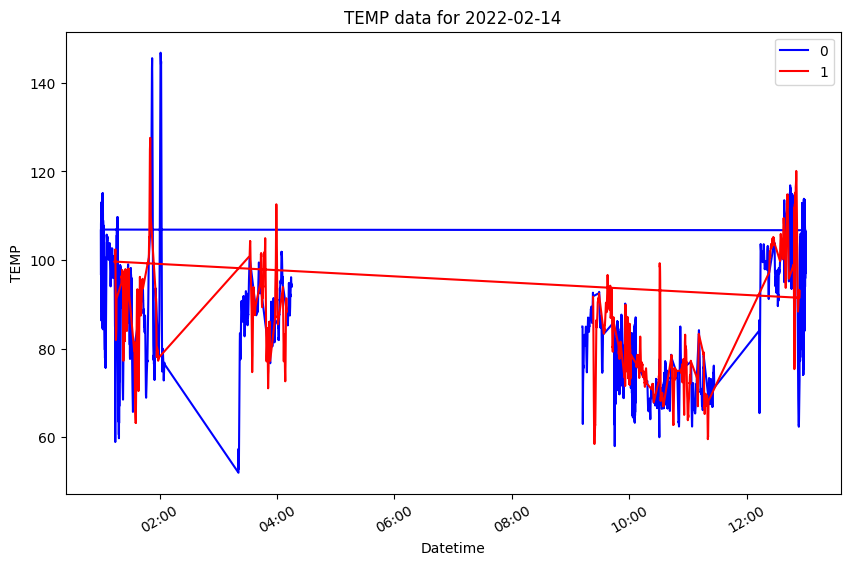

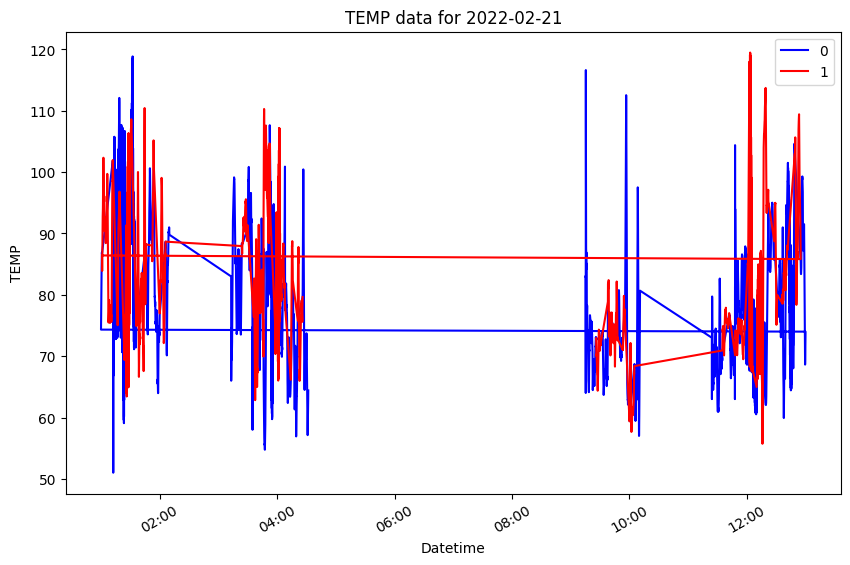

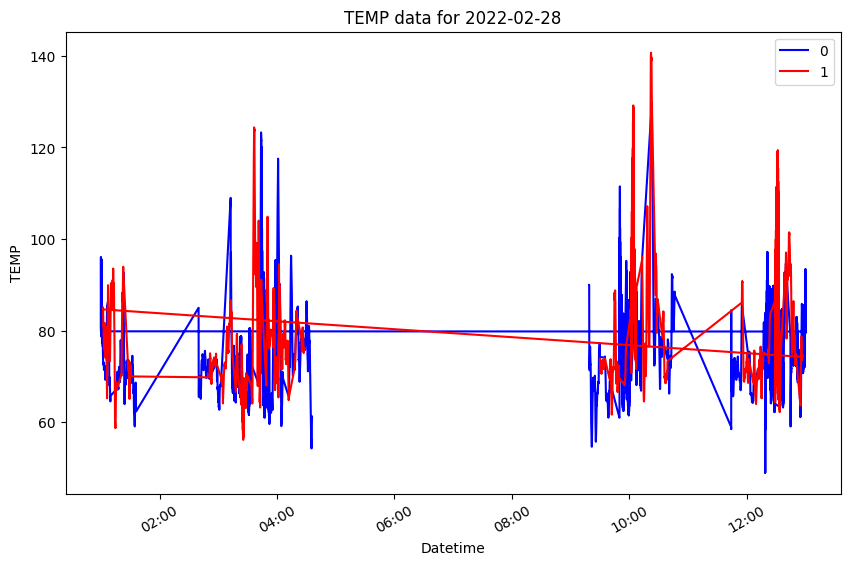

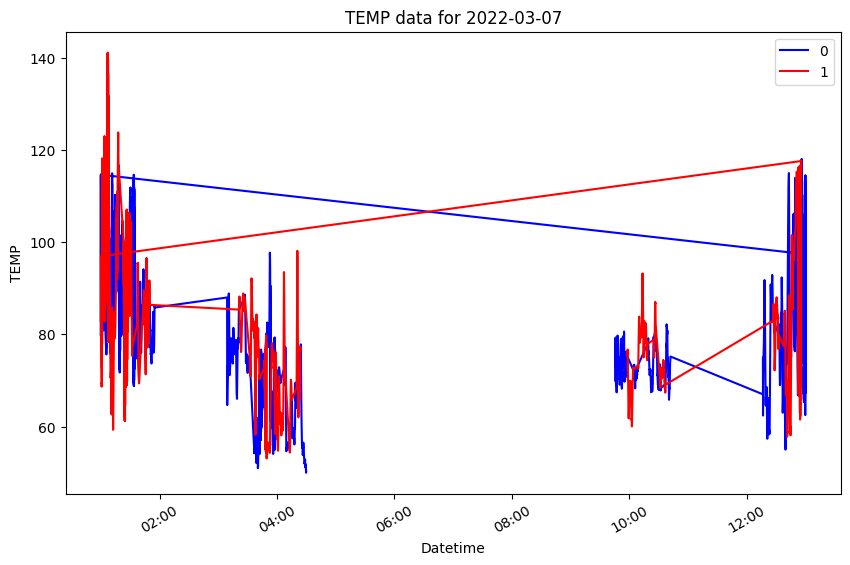

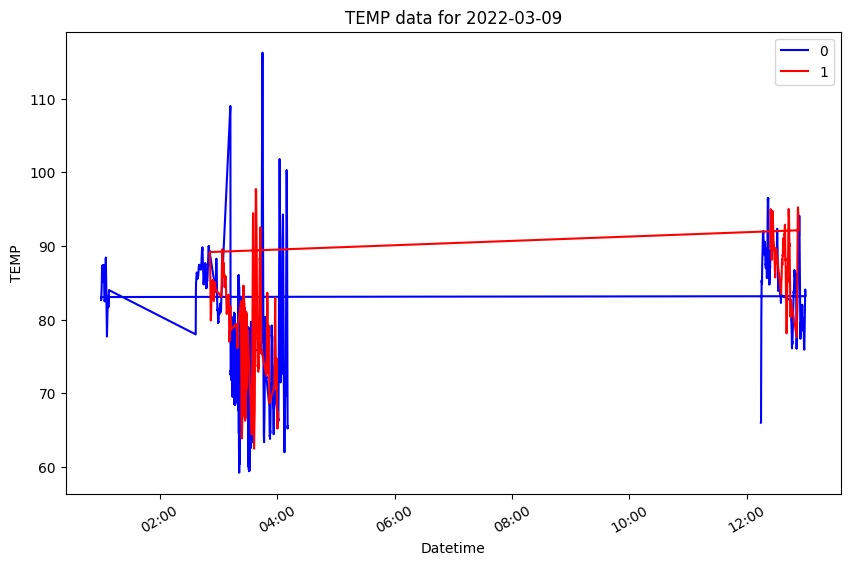

In [98]:
#List of features and graph for the graph
features = ['X','Y','Z','BVP','EDA','HR','IBI_Initial','IBI_Interval','TEMP']
dates = ['2022-02-07', '2022-02-14', '2022-02-21', '2022-02-28', '2022-03-07', '2022-03-09']
#Call the function plot1 and provide feature list and dates for the graph to be plotted
for feature in features:
  for date in dates:
    plot1(dates,feature)

#### Plot to show correlation between the features. From the below heatmap we can see


*   IBI_Interval and Heart rate is negatively correlated
*   X and Z is positively correlated 



<ipython-input-99-ff9dda9bd8b4>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = X.corr()


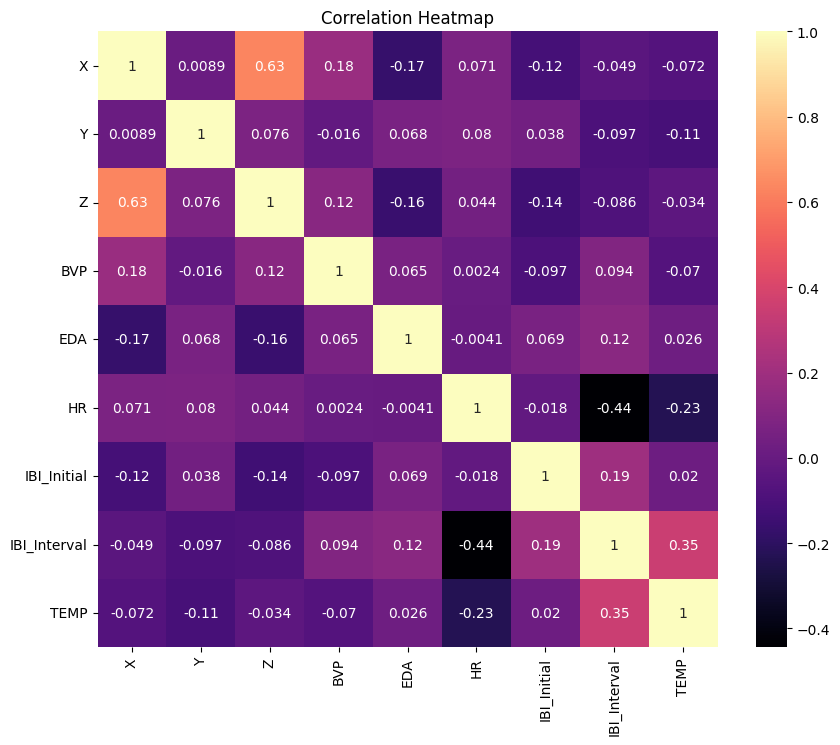

In [99]:
  # Separate X and y
  X = time_data1.drop('label', axis=1)  # drop the 'label' column to create the feature matrix
  y = time_data1['label']

  # Compute correlation matrix
  corr_matrix = X.corr()

  # Create heatmap figure
  fig, ax = plt.subplots(figsize=(10,8))

  # Plot heatmap
  sns.heatmap(corr_matrix, cmap='magma', annot=True, ax=ax)
  plt.title('Correlation Heatmap')

  # Show plot
  plt.show()

####Function to create dictionary where each key is an ID value and the corresponding value is a DataFrame containing only the rows of the particular participant

In [36]:
#Function to separate dataframe of each participant
def separate_dataframes(df):
    unique_ids = df['id'].unique()
    id_dfs = {}
    for id_val in unique_ids:
        id_dfs[id_val] = df[df['id'] == id_val].reset_index(drop=True)
    return id_dfs

####Display participant id of each participant

In [100]:
#Display each participant
id_dfs = separate_dataframes(stress_data)
print(id_dfs.keys()) # prints the unique id values

dict_keys(['02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35'])


####Function plot2 displays a graph that contains subplots of each feature for a specific participant. Each subplot shows a line plot of the data for the feature over time (datetime) for each label (0 or 1). The x-axis of each subplot represents time (datetime), while the y-axis represents the value of the feature. 

In [101]:
#Function to plot graph for each feature of each participant
def plot2(df,id):
    features = ['X', 'Y', 'Z', 'BVP', 'EDA', 'HR', 'IBI_Initial', 'IBI_Interval', 'TEMP']
    # set the figure size
    plt.figure(figsize=(10, 20))

    # define the label colors
    colors = {0: 'blue', 1: 'red'}

    # iterate over the features and plot each one
    for i, feature in enumerate(features):
        plt.subplot(len(features), 1, i+1)
        for label in [0, 1]:
            df_label = df[df['label'] == label]
            plt.plot(df_label['datetime'], df_label[feature], color=colors[label], label=label)
        plt.title(feature+' for participant: '+id)
        plt.xlabel('datetime')
        plt.ylabel(feature)
        plt.legend()

    plt.tight_layout()
    plt.show()

####Call the function plot2

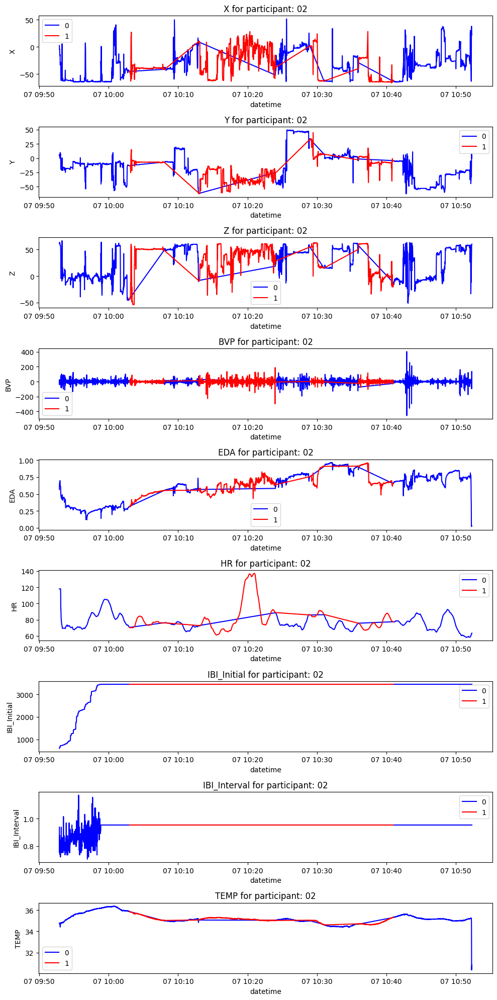

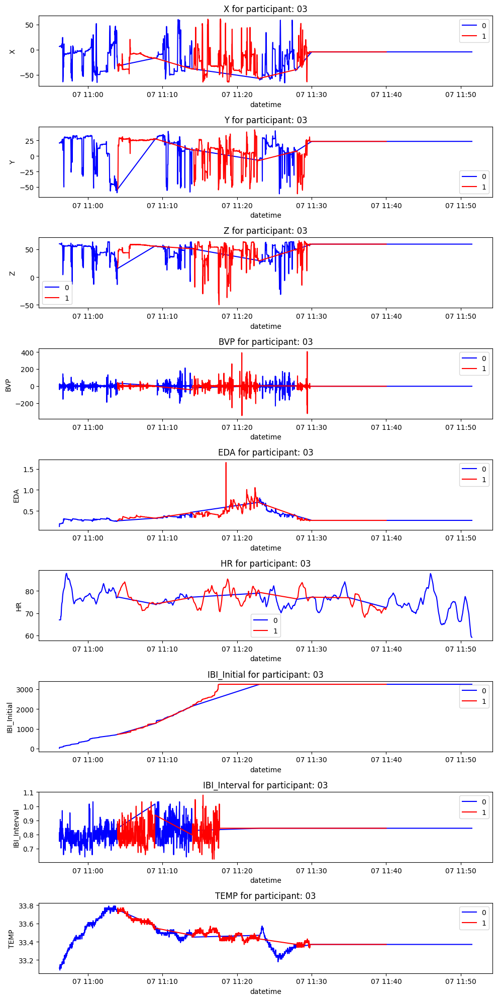

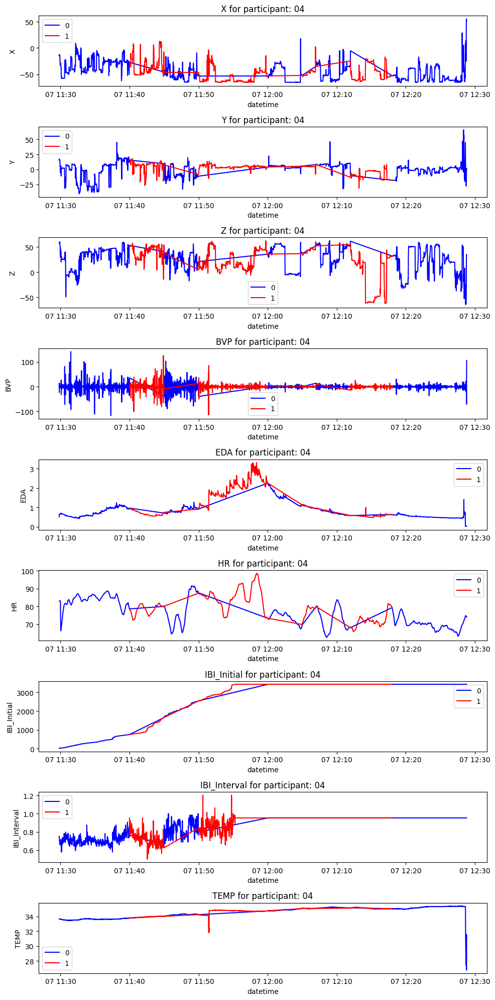

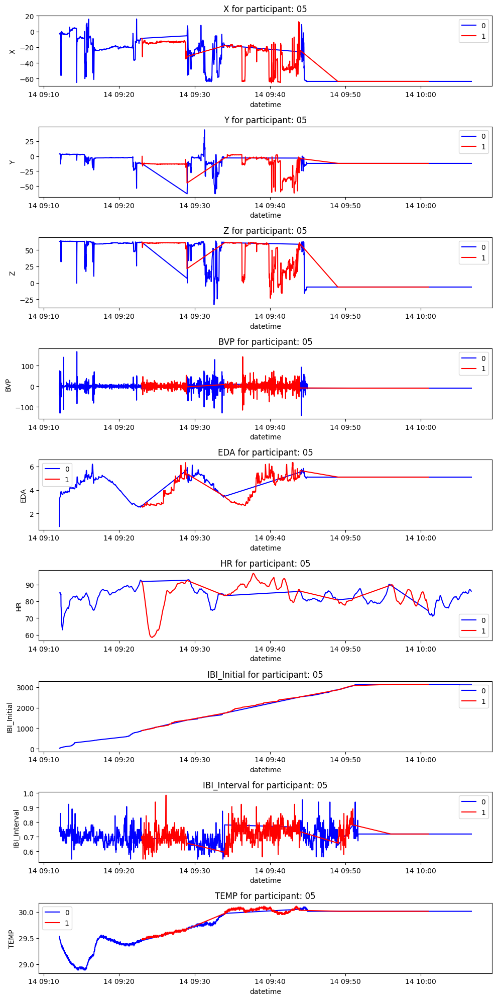

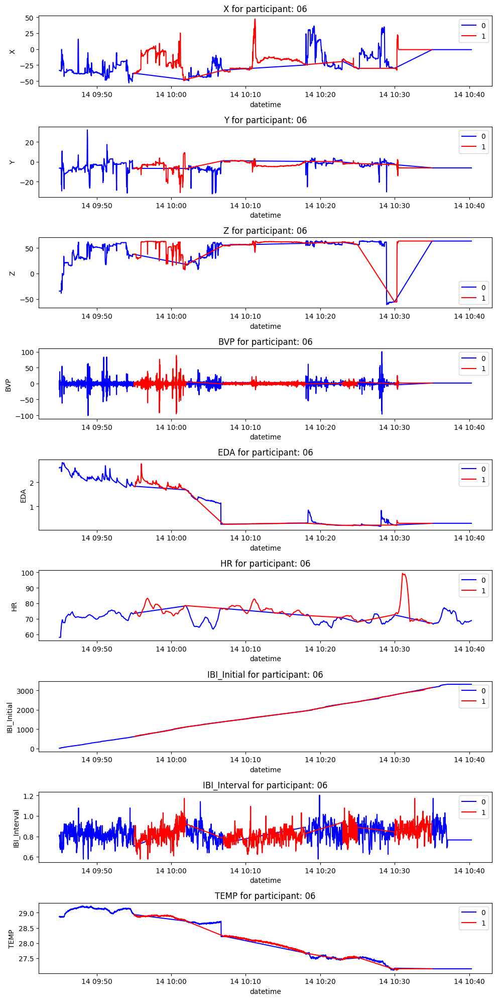

...

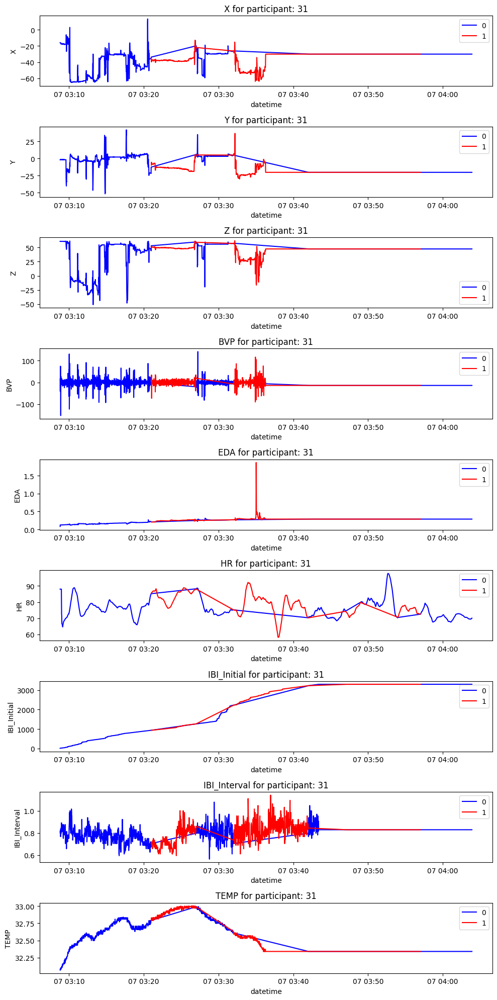

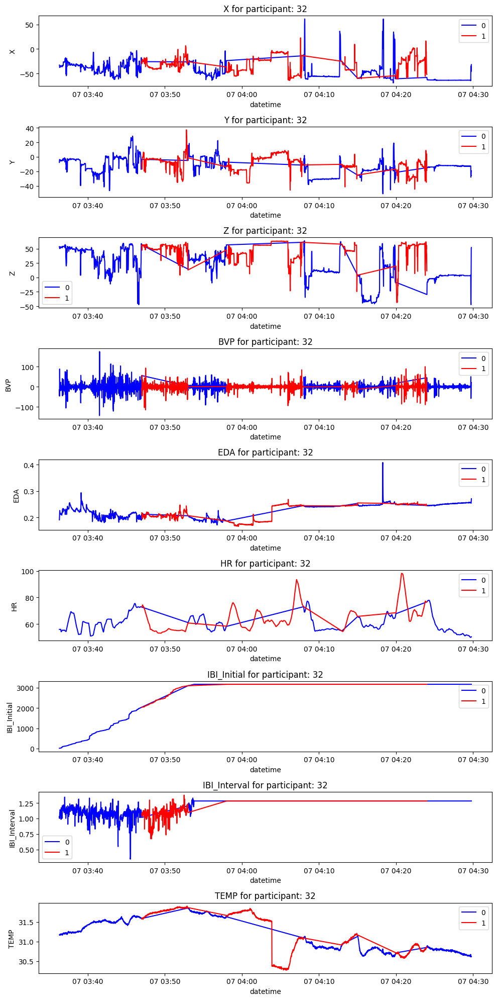

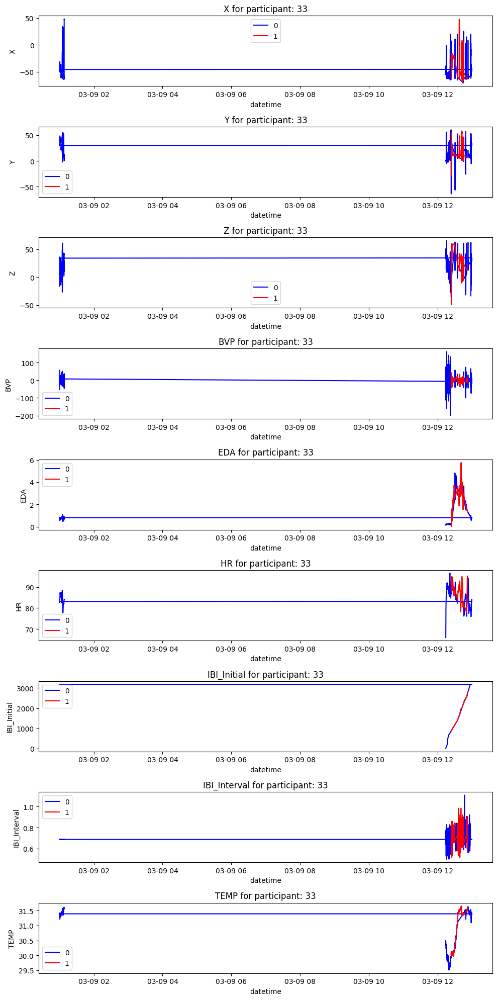

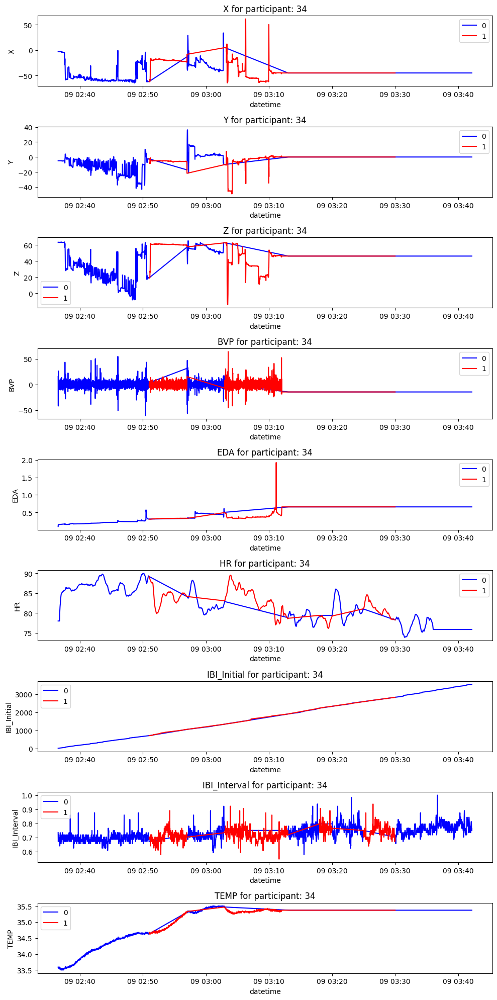

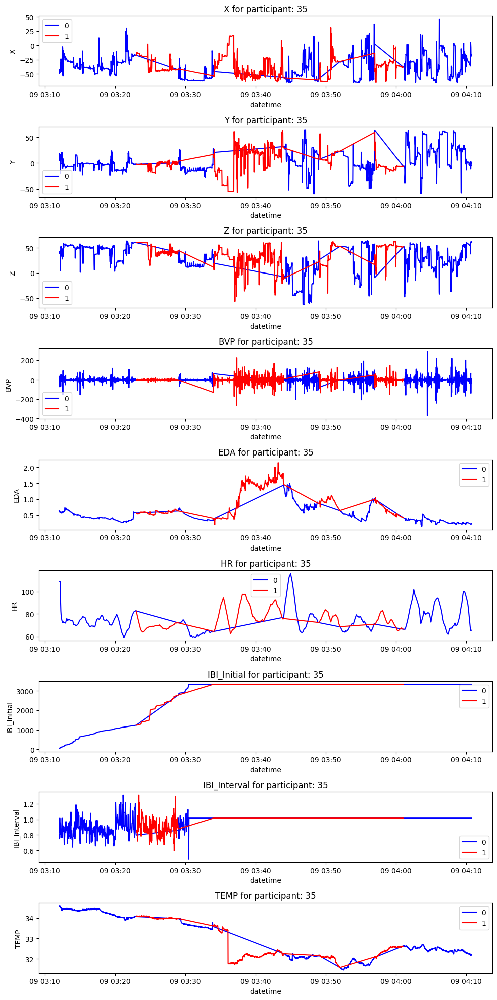

In [102]:
#Call function plot2 to plot graph for each feature of each participant
for id in id_dfs.keys():
  plot2(id_dfs[id],id)

#### Above graph shows the temporal changes in each feature for a specific participant, with each label group differentiated by color.

####Write data of each participant to csv files and save it in Input_data folder in google drive

In [103]:
input_folderpath=BaseFolderPath+'Input_data/'
# write each dataframe to CSV file with corresponding key as filename in the specified directory
for participant_id, dataframe in id_dfs.items():
    filename = os.path.join(input_folderpath, f"{participant_id}.csv")  # create filename with directory path
    dataframe.to_csv(filename, index=False) 